In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from calculations import fret_calculations, processing_cleanup
import matplotlib as mpl
from IPython.display import display
import scipy.stats as stats
from calculations.significance import set_pvalue
import matplotlib.patches as mpatches
from dataframe_handling import plotting_df_functions

mpl.style.use('default')
mpl.rcParams['axes.linewidth'] = 7  # set the value globally
mpl.rcParams['xtick.major.size'] = 20
mpl.rcParams['xtick.major.width'] = 7
mpl.rcParams['xtick.minor.size'] = 10
mpl.rcParams['xtick.minor.width'] = 7
mpl.rcParams['ytick.major.size'] = 20
mpl.rcParams['ytick.major.width'] = 7
mpl.rcParams['ytick.labelsize'] = 50
mpl.rcParams['xtick.labelsize'] = 50
mpl.rcParams['ytick.minor.size'] = 10
mpl.rcParams['ytick.minor.width'] = 7
mpl.rcParams['font.size'] = 55
mpl.rcParams['font.sans-serif'] = 'Arial'
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['svg.fonttype'] = 'none'

In [25]:
df= pd.read_csv(r'W:\OneDrive\Virus\Paper1\Raw_data_CSVs\Other\control_infection.csv')
df= df.iloc[:, 1:]
df

,label,area,donor_intensity_mean,donor_intensity_min,donor_intensity_max,donor_intensity_std,acceptor_intensity_mean,acceptor_intensity_min,acceptor_intensity_max,acceptor_intensity_std,...,construct,experiment,experimentcondition,replicate,passages,exposurecam1,cyanled,exposurecam2,blueled,greenled
0,1,9175.0,4563.437988,1660.0,8835.0,1470.880371,7512.099609,0.000000,14579.100586,2506.674072,...,GS0,Infection,Growth,1,12,25,12U5,25,12U5,6U5
1,2,4052.0,2300.797363,1262.0,4137.0,710.169861,3862.233887,0.000000,6609.236816,1246.235352,...,GS0,Infection,Growth,1,12,25,12U5,25,12U5,6U5
2,3,8236.0,3705.700928,855.0,6741.0,1384.507690,4825.379883,507.505035,9387.622070,2065.423340,...,GS0,Infection,Growth,1,12,25,12U5,25,12U5,6U5
3,4,4139.0,6429.348145,2057.0,14800.0,1833.937622,8297.202148,1857.084351,14848.644531,2705.070801,...,GS0,Infection,Growth,1,12,25,12U5,25,12U5,6U5
4,5,9809.0,2801.635254,626.0,5609.0,966.317871,3753.437744,538.694824,7499.617676,1428.647949,...,GS0,Infection,Growth,1,12,25,12U5,25,12U5,6U5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264524,25,3534.0,2317.985352,1103.0,4978.0,647.736572,1687.648682,0.000000,4743.452148,598.371765,...,mTQ2,Infection,Growth,3,31,25,12U5,25,12U5,6U5
264525,26,2637.0,3057.891846,1948.0,4228.0,492.736633,1746.623779,858.462280,2418.432617,304.290710,...,mTQ2,Infection,Growth,3,31,25,12U5,25,12U5,6U5
264526,27,6252.0,4022.268066,1162.0,6563.0,1340.034424,2294.854492,0.000000,3658.157227,778.503052,...,mTQ2,Infection,Growth,3,31,25,12U5,25,12U5,6U5
264527,28,3003.0,2886.003906,1665.0,3968.0,460.045380,1658.835449,0.000000,2314.475342,374.557129,...,mTQ2,Infection,Growth,3,31,25,12U5,25,12U5,6U5


In [3]:
comb_df = df

comb_df['construct'] = comb_df['construct'].astype(str)
comb_df['well'] = comb_df['well'].astype(str)
comb_df['experimentcondition'] = comb_df['experimentcondition'].astype(str)

#comb_df.to_csv(r'D:\OneDrive\Virus\Paper1\Raw_data_CSVs\Infection\new_parameters.csv')

In [17]:
tmp_df = comb_df
tmp_df = processing_cleanup.pixels_to_micron(tmp_df)
tmp_df = fret_calculations.acceptor_correction(tmp_df)
tmp_df = fret_calculations.calculate_efret(tmp_df)
tmp_df = processing_cleanup.area_cutoffs(tmp_df)
tmp_df = processing_cleanup.remove_maximums(tmp_df, 'directAcceptor')
tmp_df = processing_cleanup.remove_minimums(tmp_df, 'directAcceptor', value_cutoff=200)
tmp_df = processing_cleanup.directacceptor_mean_cutoffs(tmp_df, lower_cutoff=800)
tmp_df = processing_cleanup.donor_mean_cutoffs(tmp_df)
mcherry_tmp_df = tmp_df.copy()
tmp_df = processing_cleanup.infection_false_positives(tmp_df)
tmp_df = tmp_df.loc[tmp_df['mCherry_intensity_max'] < 64000]

tmp_df = processing_cleanup.infection_cutoffs(tmp_df, lower_cutoff=300, upper_cutoff=2000)
tmp_df = tmp_df.loc[tmp_df['experimentparameter'] != 'mixed_population']

###
growth_df = tmp_df.loc[tmp_df['experimentcondition'] == 'Growth']

noninfected_only = growth_df.loc[growth_df['experimentparameter'] == 'noninfected']
false_pos = growth_df.loc[growth_df['experimentparameter'] != 'noninfected']

noninfected_only['experimentparameter'] = 'Growth'

###
tmp_df['experimentcondition'] = tmp_df['experimentcondition'].replace('Infection', 'Infect')
infected_df = tmp_df.loc[tmp_df['experimentcondition'] == 'Infect']
###

recom_df = pd.concat([noninfected_only, infected_df])
control_df = recom_df.loc[(recom_df['construct'] == 'mTQ2') | (recom_df['construct'] == 'mNG')]
recom_df = recom_df.loc[(recom_df['construct'] != 'mTQ2') & (recom_df['construct'] != 'mNG')]

W:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.2\calculations\processing_cleanup.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  noninfected.loc[:, 'experimentparameter'] = 'noninfected'
W:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.2\calculations\processing_cleanup.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mixed.loc[:, 'experimentparameter'] = 'mixed_population'
W:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.2\calculations\processing_cleanup.py:109: SettingWithCopyWarning: 
A value

In [17]:


constructs = ['GS0', 'GS16', 'GS24', 'GS32', 'GS48', 'p53', 'SED1']
experiment_order = ['Infection']
experiment_condition = ['Growth', 'Infection']
experiment_parameter = ['Growth', 'noninfected', 'infected']

my_sort_dict = {
            'construct' : constructs,
            'experiment': experiment_order,
            'experimentcondition': experiment_condition,
            'experimentparameter': experiment_parameter, 
               }



recom_df = processing_cleanup.sort_values(recom_df, my_sort_dict)
recom_df = recom_df.reset_index(drop=True)


In [18]:

groupby_values = ['construct', 'experiment', 'experimentcondition', 'experimentparameter',  'timepoint']

filtered_df = processing_cleanup.remove_outliers(recom_df, groupby_values, 'Efret')


In [19]:
filtered_df.to_pickle(r'W:\OneDrive\Virus\Paper1\processed_csvs\combined_experiments\control_infection_data.pkl')

In [101]:
#get median stats of the experiment and for the well

groupby_values_per_repeat = ['construct', 'date', 'experiment', 'experimentcondition', 'experimentparameter', 'well', 'timepoint']
groupby_values_per_experiment = ['construct', 'experiment', 'experimentcondition', 'experimentparameter',  'timepoint']

total_stats_df = processing_cleanup.get_stats(filtered_df, groupby_values_per_repeat)
experiment_stats = processing_cleanup.get_stats(filtered_df, groupby_values_per_experiment)
#display(total_stats_df)

test = total_stats_df['Efret_list'].apply(np.array) - total_stats_df['Efret_median']


In [102]:
groupby_values_experiment = ['construct', 'experiment', 'experimentcondition',  'timepoint', 'experimentparameter']
total_stats_df = processing_cleanup.drop_counts(total_stats_df, count=25)
holder_df = processing_cleanup.get_population_significance(total_stats_df, groupby_values_experiment, equal_var=False)
ttest_df = holder_df.dropna()

In [103]:
new_values =  ['construct', 'experiment', 'experimentcondition', 'experimentparameter', 'timepoint']

population_count_df = processing_cleanup.get_stats(total_stats_df, new_values, ['count'], stat_column='Efret_median')
median_std_df = processing_cleanup.get_stats(total_stats_df, new_values, ['std'], stat_column='Efret_median')
list_efret_df = processing_cleanup.get_stats(total_stats_df, new_values, ['list'], stat_column='Efret_median')
population_count_df = population_count_df.drop(columns=new_values)
median_std_df = median_std_df.drop(columns = new_values)
list_efret_df = list_efret_df.drop(columns = new_values)
population_count_df = population_count_df.rename(columns={'Efret_median_count': 'well_count_per_timepoint'})
median_std_df = median_std_df.rename(columns={'Efret_median_std': 'std_median_per_timepoint'})
list_efret_df = list_efret_df.rename(columns={'Efret_median_std': 'list_median_per_timepoint'})


In [104]:
merged_data = pd.concat([experiment_stats, population_count_df, median_std_df, list_efret_df], axis=1)
#merged_data.to_csv(r'E:\Patrick\Test_data.csv')

merged_data = merged_data.merge(ttest_df, on=['construct', 'experiment', 'experimentcondition', 'experimentparameter', 'timepoint'])

In [105]:
merged_delta = merged_data.copy()

merged_delta = processing_cleanup.delta_time(merged_delta, 'Efret_median', comparison= 4)
merged_delta = processing_cleanup.remove_controls(merged_delta)
#merged_delta = processing_cleanup.drop_counts(merged_delta, count=30)

merged_delta = processing_cleanup.delta_time(merged_delta, 'Efret_median_list', comparison= 4)



total_df = total_stats_df.copy()

total_df = processing_cleanup.delta_time(total_df, 'Efret_median', comparison= 4)
total_df = processing_cleanup.remove_controls(total_df)


total_df = processing_cleanup.delta_list_median(total_df, merged_delta, 'Efret_list', comparison= 4)

In [106]:
consolidated_values = total_df.groupby(['construct', 'experiment', 'experimentparameter', 'timepoint'], observed=False, as_index=False)['delta_Efret_median'].apply(np.array)
consolidated_values = consolidated_values.loc[(consolidated_values['construct']!= 'mTQ2') & (consolidated_values['construct']!= 'mNG')]

merged_delta = merged_delta.merge(consolidated_values, on=['construct', 'experiment', 'experimentparameter', 'timepoint'], how='left')

consolidated_values = total_df.groupby(['construct', 'experiment', 'experimentparameter', 'timepoint'], observed=False, as_index=False)['delta_Efret_list'].apply(np.array)
consolidated_values = consolidated_values.loc[(consolidated_values['construct']!= 'mTQ2') & (consolidated_values['construct']!= 'mNG')]
consolidated_values = consolidated_values.dropna().reset_index(drop=True).rename(columns={'delta_Efret_median': 'delta_Efret_population'})

merged_delta = merged_delta.merge(consolidated_values, on=['construct', 'experiment', 'experimentparameter', 'timepoint'], how='left')


merged_df = plotting_df_functions.create_list_columns(total_df, merged_delta)
merged_df = plotting_df_functions.create_list_columns(total_df, merged_delta, type = 'list')

In [107]:
tmpr_df = merged_delta.copy()

construct_order = {c: i + 1 for i, c in enumerate(constructs)}


tmpr_df['base_position'] = tmpr_df['construct'].map(construct_order)

# Step 2: For each unique (construct, experimentparameter) pair, compute a subposition offset.
# This mapping is computed once, so it is consistent across all timepoints.
mapping = {}
for construct, order in construct_order.items():
    
    # Get unique experimentparameters for this construct, preserving order of appearance
    unique_params = pd.unique(tmpr_df.loc[tmpr_df['construct'] == construct, 'experimentparameter'])
    n = len(unique_params)
    # Compute offsets evenly in [-0.5, 0.5] (you can adjust the range as needed)
    offsets = (np.arange(n) - (n-1) / 2) / 4
    for exp, offset in zip(unique_params, offsets):
        mapping[(construct, exp)] = offset

# Step 3: Apply the mapping to assign a subposition to every row.
tmpr_df['subposition_offset'] = tmpr_df.apply(lambda row: mapping[(row['construct'], row['experimentparameter'])], axis=1)

tmpr_df['base_position'] = tmpr_df['base_position'].astype(int)
# Step 4: The final plot position for a row is the sum of its base position and subposition offset.
tmpr_df['plot_position'] = tmpr_df['base_position'] + tmpr_df['subposition_offset']

#constructs = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']
#experiment_order = ['Infection']
#experiment_condition = ['Growth', 'Infection']
#experiment_parameter = ['Growth', 'noninfected', 'low infection', 'med infection', 'high infection']

my_sort_dict = {
            'construct' : constructs,
            'experiment': experiment_order,
            'experimentcondition': experiment_condition,
            'experimentparameter': experiment_parameter, 
               }


tmpr_df = processing_cleanup.sort_values(tmpr_df, my_sort_dict)

In [95]:
tmpr_df.columns

Index(['construct', 'experiment', 'experimentcondition', 'experimentparameter',
       'timepoint', 'Efret_mean', 'Efret_median', 'Efret_min', 'Efret_max',
       'Efret_std', 'Efret_count', 'Efret_var', 'Efret_list',
       'well_count_per_timepoint', 'std_median_per_timepoint',
       'Efret_median_list', 'ttest', 'pvalue', 'star_value',
       'delta_Efret_median_x', 'delta_Efret_median_list',
       'delta_Efret_median_y', 'delta_Efret_list', 'base_position',
       'subposition_offset', 'plot_position'],
      dtype='object')

In [114]:
#make time dataplots for each construct
plot_df = tmpr_df.loc[tmpr_df['timepoint']!= 0]
plot_df['timepoint'] = (plot_df['timepoint'] * 6)
generator = plot_df.groupby('construct', observed=True)
mpl.rcParams['figure.dpi'] = 500
fig_len = plot_df.construct.nunique()
fig, ax =plt.subplots(fig_len,  1, figsize=(20,40)) 
for index, container in enumerate(generator):
    construct = container[0]
    
    if index < fig_len:
        container_df = container[1]
        
        
        indexer = 0
        colors = ['k', 'dodgerblue', 'firebrick']
        for parameter in container_df.experimentparameter.unique():
            
            current_parameter = container_df.loc[container_df['experimentparameter']== parameter]
            
            
            ax[index].scatter(x=current_parameter['timepoint'], y=current_parameter['delta_Efret_median_x'], alpha=0.6, c=colors[indexer], zorder=3, s=500)
            ax[index].errorbar(current_parameter['timepoint'], current_parameter['delta_Efret_median_x'], yerr = current_parameter['std_median_per_timepoint'], c=colors[indexer],
                                                    capsize=2, capthick=2, alpha=0.6, linewidth=5)
            indexer += 1
        ax[index].set_ylim(-0.03, 0.03)
        ax[index].set_yticks([ -0.015, 0, 0.015])
        ax[index].set_xticks([])
        ax[index].axvline(x=24, c='k', linestyle='--', linewidth=5)
        ax[index].axhline(y=0.0, c='k', linestyle='--', linewidth=5)
        ax2 = ax[index].twinx()
        ax2.set_yticks([])
        ax2.set_ylabel(ylabel = str(construct))
        tick_array = np.unique(np.array(plot_df['timepoint']))
        ax[index].set_xticks(tick_array)




fig.suptitle('Infection Experiment Timeline', fontsize=10, x=0.5, y=0.89)
plt.subplots_adjust(hspace=0)

plt.savefig(r'W:\OneDrive\Virus\Paper1\Paper1_figures\Violin_figures\infection_control_timeline_figure_popcutoff-10000.svg', format='svg', bbox_inches='tight')

C:\Users\Owner\AppData\Local\Temp\ipykernel_37796\3836219981.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['timepoint'] = (plot_df['timepoint'] * 6)


C:\Users\Owner\AppData\Local\Temp\ipykernel_37796\1690969255.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_tmp['timepoint'] = new_tmp['timepoint'] * 6


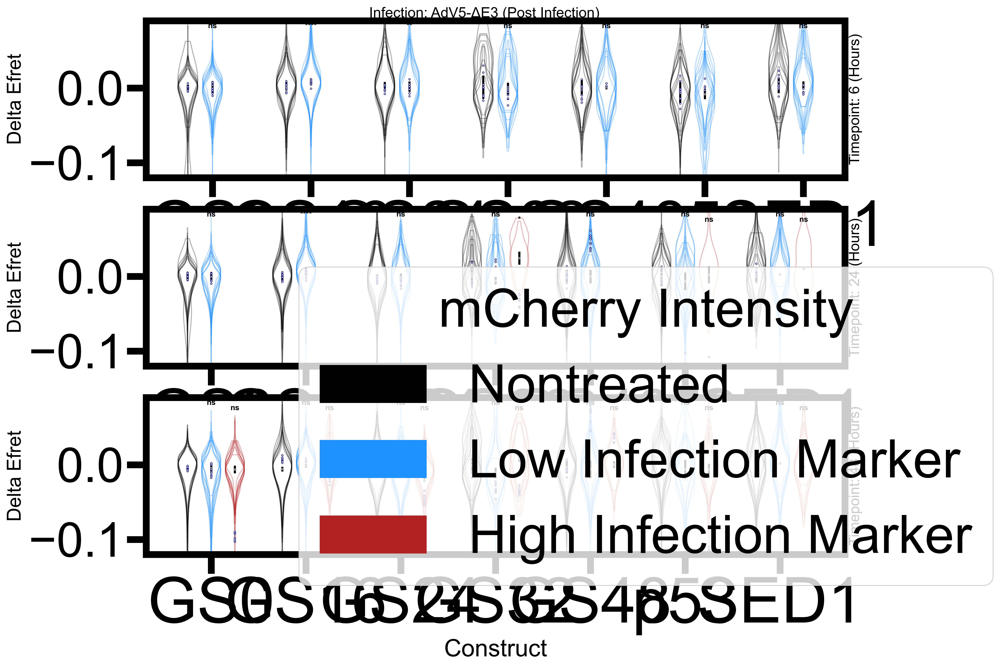

In [111]:
#dataframes are merged_data, experiment_stats, and test_df
replaced_data = tmpr_df
reduced_df = replaced_data.loc[(replaced_data['timepoint']==1) | (replaced_data['timepoint']==4) | (replaced_data['timepoint']==8)]

mpl.rcParams['figure.dpi'] = 500
save_plot = False

unique_parameters = reduced_df.experimentparameter.unique()
color_palette = ['k', 'dodgerblue', 'firebrick', 'brown']
colors = {}

for i, param in enumerate(unique_parameters):
    colors[param] = color_palette[i]

construct = len(reduced_df.construct.unique())
timepoints = len(reduced_df.timepoint.unique())
parameter = len(reduced_df.experimentparameter.unique())
grouped_values = ['timepoint']

uni_construct = reduced_df.construct.unique()
#indexer length
row_len = timepoints

fig, ax = plt.subplots(row_len, 1, figsize=(13,10))

new_tmp = reduced_df
new_tmp['timepoint'] = new_tmp['timepoint'] * 6
median_violin_generator = new_tmp.groupby(grouped_values, observed=True, as_index=True)

for index, container in enumerate(median_violin_generator):
    tmp_df = container[1]
    row = index
    ax[row].scatter(x= tmp_df['plot_position'], y=tmp_df['delta_Efret_median_x'], s=3, c='gray', zorder=3)
    ax[row].errorbar(x= tmp_df['plot_position'], y=tmp_df['delta_Efret_median_x'], yerr= tmp_df['std_median_per_timepoint'], linestyle='none', color='k',elinewidth=2.2)
    y=0
    con_holder = None
    for x in tmp_df['plot_position']:
        len_param = tmp_df.experimentparameter.nunique()
        current_construct = tmp_df.loc[tmp_df['plot_position']==x, 'construct'].iloc[0]
        if con_holder is None:
            con_holder = current_construct
            y+=1
            continue
        
        if con_holder != current_construct:
            y=0
            con_holder = current_construct
            y+=1
            continue
        
        if y == len_param:
            y=0
            y+=1
            continue
            
            
        y_pos = 0.087 - y*0.007
        star_val = tmp_df.loc[tmp_df['plot_position']==x, 'star_value']
        ax[row].text(x, y_pos, s=star_val.iloc[0], fontsize=8, fontweight='bold', ha='center')
        y+=1
    ax[row].set_ylim([-0.12, 0.09])
    tmp_explode = tmp_df.explode('delta_Efret_median_list')
    ax[row].scatter(x=tmp_explode['plot_position'] , y=tmp_explode['delta_Efret_median_list'], s=3, c='white', edgecolor='navy', linewidth=0.5, zorder=3)

    tmp_explode = tmp_df.explode('delta_Efret_list')
    
    iterator = 0 
     
    
    
    for x in tmp_df['plot_position']:
        list_explode = tmp_explode.loc[tmp_explode['plot_position']== x]
        current_parameter = tmp_explode.loc[tmp_explode['plot_position']== x, 'experimentparameter'].iloc[0]
        
        len_dataframe = len(list_explode)
        
        len_para = tmp_explode.experimentparameter.nunique()
        if iterator == len_para:
            iterator = 0
        if 'Growth' == current_parameter:
            iterator = 0 
            
        current_color = colors[current_parameter]
        
        for sub in range(len_dataframe):
            current_dataframe = list_explode.iloc[sub]
            
            final_explode = current_dataframe['delta_Efret_list']
            violins =ax[row].violinplot(final_explode, [x], widths=0.2, showextrema=False, showmedians=False, showmeans=False)

            
            for pc in violins['bodies']:
                pc.set_facecolor('None')
                pc.set_edgecolor(current_color)
                pc.set_aplha=0.3

        iterator += 1
    
    ax[row].set_xticks(np.arange(1, construct+1, 1))
    ax[row].set_xticklabels(uni_construct, fontsize='large')


    twinax = ax[row].twinx()
    twinax.set_ylabel('Timepoint: '+ str(container[0][0])+ ' (Hours)', fontsize=15)
    twinax.set_yticks([])

    ax[row].set_ylabel('Delta Efret', fontsize=20)
ax[-1].set_xlabel('Construct', fontsize=25)

patch = []
labels = ['Nontreated', 'Low Infection Marker', 'High Infection Marker']
for color, label in zip(color_palette, labels):
    
    tmp_patch = mpatches.Patch(color=color, label=label)
    patch.append(tmp_patch)
plt.legend(title='mCherry Intensity', handles=patch, loc='upper right', bbox_to_anchor=(1.25, 2))

fig.suptitle('Infection: AdV5-'+'\u0394'+'E3 (Post Infection)', fontsize=15, x=0.5, y=0.9)
if save_plot:
    plt.savefig(r'D:\OneDrive\Virus\Paper1\Paper1_figures\Violin_figures\infection_control_violin_figure_popcutoff-10000.png', format='png', bbox_inches='tight')
plt.show()


D:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.1\calculations\processing_cleanup.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  noninfected.loc[:, 'experimentparameter'] = 'noninfected'
D:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.1\calculations\processing_cleanup.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mixed.loc[:, 'experimentparameter'] = 'mixed_population'
D:\OneDrive\Virus\SpudVersions\SpudMaster_v0.0.3.1\calculations\processing_cleanup.py:109: SettingWithCopyWarning: 
A value

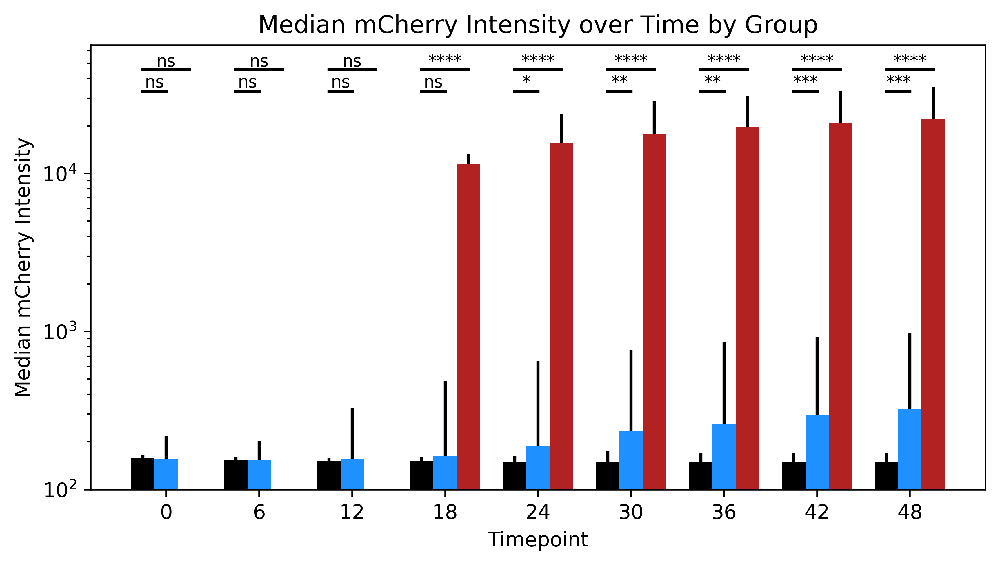

In [26]:
line_mcherry_df = mcherry_tmp_df.copy()
line_mcherry_df = line_mcherry_df.loc[(line_mcherry_df['construct'] != 'mTQ2') & (line_mcherry_df['construct'] != 'mNG')]

line_mcherry_df['timepoint'] = line_mcherry_df['timepoint']* 6 
# Set up the figure
#line_mcherry_df = processing_cleanup.infection_false_positives(line_mcherry_df)
line_mcherry_df = processing_cleanup.infection_cutoffs(line_mcherry_df)
line_mcherry_df = line_mcherry_df.loc[line_mcherry_df['experimentparameter']!= 'mixed_population']
growth_only = line_mcherry_df.loc[line_mcherry_df['experimentcondition'] == 'Growth']
growth_only['experimentparameter'] = 'Growth'
infected_only = line_mcherry_df.loc[line_mcherry_df['experimentcondition'] != 'Growth']
new_mcherry_df = pd.concat([growth_only, infected_only])
fig, ax = plt.subplots(figsize=(7, 4))

# Extract unique parameters and timepoints
experimentparameters = new_mcherry_df ['experimentparameter'].unique()
timepoints = sorted(new_mcherry_df ['timepoint'].unique())

# Bar plot settings
x = np.arange(len(timepoints))  # X locations for the timepoints
width = 0.25  # Width of the bars
n_groups = len(experimentparameters)
colors = ['k', 'dodgerblue', 'firebrick']  # Just to make it look nicer

# Plotting each experimentparameter group
for i, param in enumerate(experimentparameters):
    # Filter and aggregate for current group
    group_df = new_mcherry_df[new_mcherry_df['experimentparameter'] == param]
    if param == 'Growth':
        comparison_group = group_df.groupby(['timepoint', 'construct'], as_index=False)['mCherry_intensity_mean'].median()
    else:
        variable_group = group_df.groupby(['timepoint', 'construct'], as_index=False)['mCherry_intensity_mean'].median()
        signi_dict = {}
        for len_indexer, time in enumerate(timepoints):
            current_comp = comparison_group.loc[comparison_group['timepoint']== time]
            current_var = variable_group.loc[variable_group['timepoint']== time]
            list_comp_values = current_comp['mCherry_intensity_mean'].to_list()
            list_var_values = current_var['mCherry_intensity_mean'].to_list()
            ttest, pvalue = stats.ttest_ind(list_comp_values, list_var_values)
            star_value = set_pvalue(pvalue)
            signi_dict[len_indexer] = star_value
    
    medians = group_df.groupby('timepoint')['mCherry_intensity_mean'].median().reindex(timepoints).fillna(0)

    central_vals = group_df.groupby('timepoint')['mCherry_intensity_mean'].median().reindex(timepoints).fillna(0)
    upper_errors = group_df.groupby('timepoint')['mCherry_intensity_mean'].std().reindex(timepoints).fillna(0)
    # Create asymmetric error bars: no lower bar
    yerr = [np.zeros_like(upper_errors), upper_errors.values]
    
    offset = (i - n_groups/2) * width + width/2
    if param == 'Growth':
        growth_offset_list = x + offset
    if param != 'Growth':
        for key, item in signi_dict.items():
            y_offset = 60000 - (25000/i)
            x_pos = key + offset

            #plot horizontal lines
            growth_pos = growth_offset_list[key]
            x_coord = [growth_pos, x_pos]
            y_coord = [y_offset-2000, y_offset-2000]
            ax.plot(x_coord, y_coord, 'k-')

            star_xplot = x_pos - (x_pos-growth_pos)/2
            ax.text(star_xplot, y_offset, item, ha='center', fontsize='small')

            
            
        
    ax.bar(x + offset, central_vals, yerr=yerr, width=width, label=param,
           color=colors[i % len(colors)], capsize=0)
    ax.set_ylim([100, 65000])
    ax.set_yscale('log')

# Formatting
ax.set_xlabel('Timepoint')
ax.set_ylabel('Median mCherry Intensity')
ax.set_title('Median mCherry Intensity over Time by Group')
ax.set_xticks(x)
ax.set_xticklabels(timepoints)
#ax.legend(title='Experiment Group')
plt.tight_layout()

#plt.savefig(r'D:\OneDrive\Virus\Paper1\Paper1_figures\Violin_figures\infection_barplot_figure_popcutoff-10000.png', format='png', bbox_inches='tight')

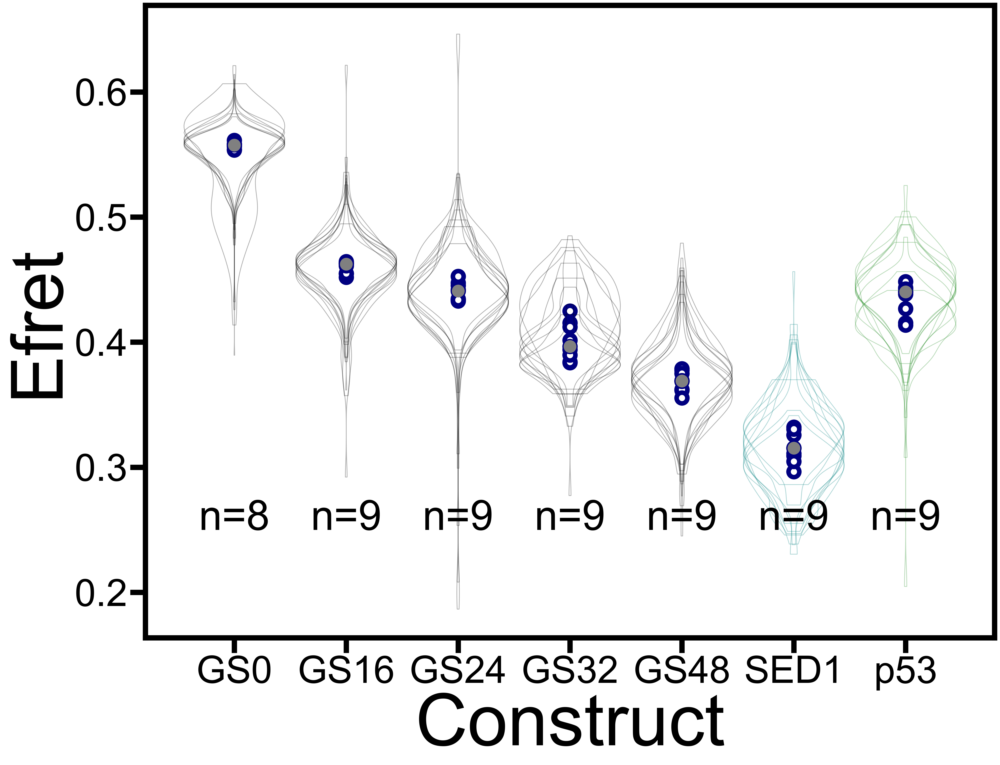

In [83]:
#basal cell map
import seaborn as sns

fig, ax = plt.subplots(figsize=(20, 15))
colors = ['k', 'k', 'k', 'k', 'k', 'teal', 'forestgreen']
basal_cell_df = filtered_df
basal_cell_df = basal_cell_df.loc[(basal_cell_df['timepoint'] == 4) & (basal_cell_df['experimentparameter'] ==  'Growth')]
basal_cell_df = basal_cell_df.loc[(basal_cell_df['construct'] != 'mTQ2') & (basal_cell_df['construct'] != 'mNG')]

basal_generator = basal_cell_df.groupby(['construct', 'date', 'well'], observed=True)
medians = basal_generator['Efret'].median()
for index, df_container in enumerate(basal_generator):
    if index == 0:
        #select first color
        color = colors[index]
        #initiate positions for plots
        position = 1
        #set current_construct to change positions
        current_construct = df_container[0][0]
        #initiate list for x tick label axis
        x_tick_list = [current_construct]
        
        # set up statistics to plot
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
        
    if current_construct != df_container[0][0]:
        color = colors[position]
        position += 1
        current_construct = df_container[0][0]
        x_tick_list.append(current_construct)
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
    if not plot_stats:
        #ax.errorbar(x=[position] * len(current_medians), 
                    #y=current_medians, yerr=experiment_std, color='k', linewidth=20, zorder=1, markersize=0)
        ax.scatter(x=[position], y=experiment_median, zorder=3, color='gray', s=250 )
        ax.scatter(x = [position] * len(current_medians), y= current_medians, s=200, edgecolor='navy', linewidth=6, c='white')
        ax.text(position, 0.25, s='n='+str(len(current_medians)), ha ='center')
        
        plot_stats = True
    basal_df = df_container[1]
    data = basal_df['Efret']
    violins = ax.violinplot(data, [position], widths=0.9, 
    showextrema=False, showmedians=False, showmeans=False)

    for pc in violins['bodies']:
        pc.set_facecolor('None')
        pc.set_edgecolor(color)
        pc.set_aplha=0.3
ax.set_xticks(np.arange(1, len(x_tick_list)+1, 1))
ax.set_xticklabels(x_tick_list)    
ax.set_ylabel('Efret', fontsize='xx-large')
ax.set_xlabel('Construct', fontsize='xx-large')
plt.savefig(r'W:\OneDrive\Virus\Paper1\Paper1_figures\Violin_figures\basal_control_violin_overlays.svg', format='svg', bbox_inches='tight')

In [57]:
[5] *7

[5, 5, 5, 5, 5, 5, 5]

In [66]:
def model(x, a, b, c):
    """Example: shifted exponential decay."""
    return a * np.exp(-b * x) + c

In [82]:
xfit

array([96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96., 96.,
       96., 96., 96., 96., 96., 96., 96., 96., 96.])

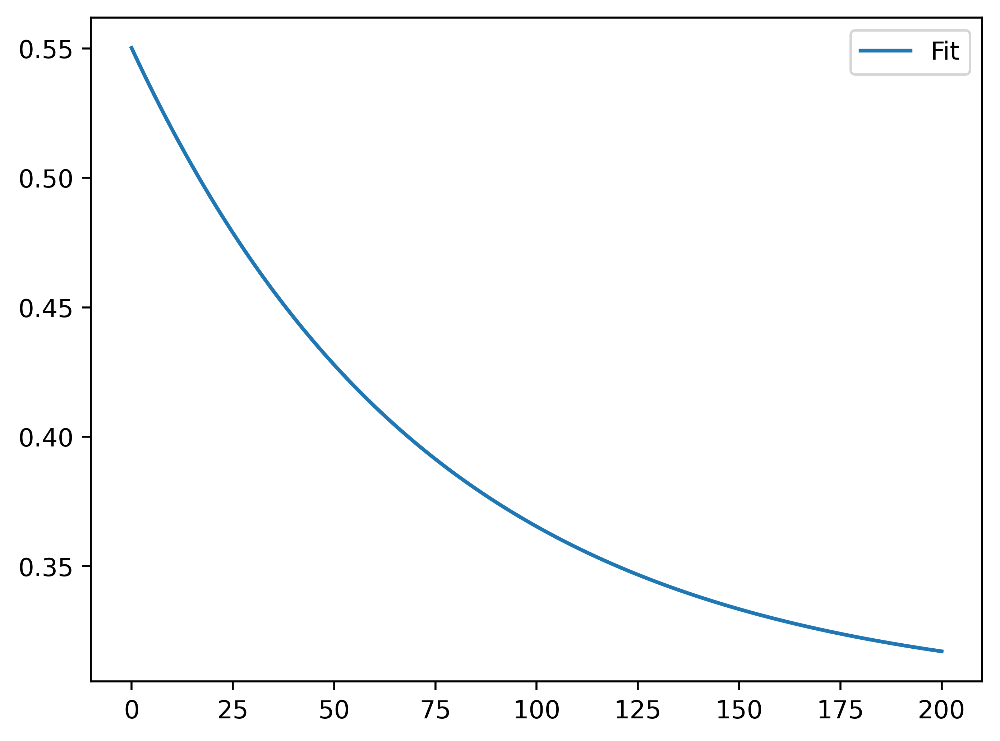

In [33]:
#Efret Set to size of linker 
from scipy.optimize import curve_fit
GS_linkers = ['GS0' , 'GS16', 'GS24', 'GS32', 'GS48']


gs_list = [filtered_df.loc[filtered_df['construct'] == linker] for linker in GS_linkers]
gs_df = pd.concat(gs_list)
gs_df['construct_length'] = gs_df['construct'].str.extract(r'GS(\d+)').astype(int) * 2

        # store parameters / covariances

popt, pcov = curve_fit(model, gs_df['construct_length'], gs_df['Efret'],
                           p0=(1, 0.1, 0), maxfev=5000)

fig, ax = plt.subplots()
nominal_lengths = gs_df.construct_length.unique()

xfit = np.linspace(gs_df['construct_length'].min(), 200, 200)
ax.plot(xfit, model(xfit, *popt), label='Fit')

ax.legend()
plt.show()

for length in gs_df['construct_length'].unique():
    current_df = gs_df.loc[gs_df['construct_length']== length]
    violins = ax.violinplot(current_df['Efret'], [length], widths=5)

100


100

In [36]:
def violin_overlays(df, group_values):
    for index, df_container in enumerate(generator):
        pass

def violin_plot(ax, df_container, color='k'):
    current_construct = df_container[0][0]
    current_df = df_container[1]
    length = df_container[0][3]
    violins = ax.violinplot(current_df, [length], widths=5, showextrema=False, showmedians=False, showmeans=False)
    
    for pc in violins['bodies']:
        pc.set_facecolor('None')
        pc.set_edgecolor(color)
        pc.set_aplha=0.3

C:\Users\patri\AppData\Local\Temp\ipykernel_17936\3194934344.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gs_generator = gs_df.groupby(group_values)['Efret']
C:\Users\patri\AppData\Local\Temp\ipykernel_17936\3194934344.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_constructs['construct_length'] = other_constructs['construct'].map(construct_len_dict)
C:\Users\patri\AppData\Local\Temp\ipykernel_17936\3194934344.py:59: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass 

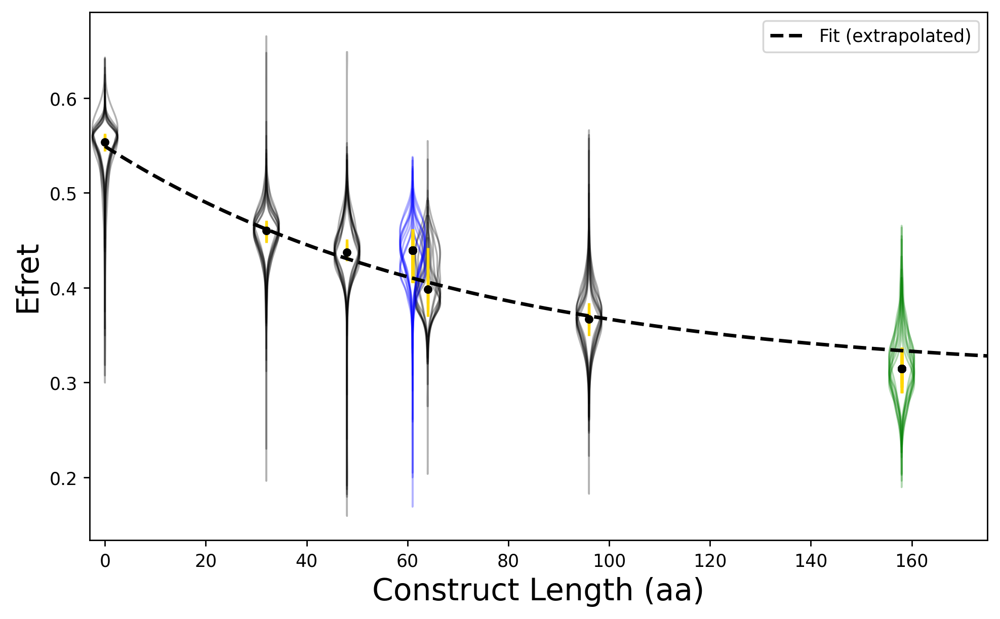

In [37]:
GS_linkers = ['GS0' , 'GS16', 'GS24', 'GS32', 'GS48']
filtered_df = filtered_df.loc[filtered_df['experimentparameter']=='Growth']
gs_list = [filtered_df.loc[filtered_df['construct'] == linker] for linker in GS_linkers]
gs_df = pd.concat(gs_list)

mpl.rcParams['figure.dpi'] = 250
gs_df['construct_length'] = gs_df['construct'].str.extract(r'GS(\d+)').astype(int) * 2


def model(x, a, b, c):
    return a * np.exp(-b * x) + c

popt, pcov = curve_fit(
    model,
    gs_df['construct_length'].values,
    gs_df['Efret'].values,
    p0=(1, 0.1, 0),
    maxfev=5000
)


fig, ax = plt.subplots(figsize=(8, 5))

group_values = ['construct', 'date', 'well', 'construct_length']
uni_lens = gs_df['construct_length'].unique()


gs_generator = gs_df.groupby(group_values)['Efret']
medians = gs_generator.median()
for index, df_container in enumerate(gs_generator):
    if index == 0: 
        current_construct = df_container[0][0]
        # set up statistics to plot
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
    if current_construct != df_container[0][0]:
        current_construct = df_container[0][0]
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
    if not plot_stats:
        ax.errorbar(x= [df_container[0][3]]* len(current_medians), 
                    y=current_medians, yerr=experiment_std, color='gold')
        ax.scatter(x=[df_container[0][3]], y=experiment_median, zorder=3, color='k', s=15)
        
        plot_stats = True
    
    violin_plot(ax, df_container, 'k')

#plot know distances
other_constructs = filtered_df.loc[(filtered_df['construct']=='p53') | (filtered_df['construct']=='SED1')]
construct_len_dict = {'p53': 61, 'SED1': 158}

other_constructs['construct_length'] = other_constructs['construct'].map(construct_len_dict)
color = ['green', 'blue']
construct_generator = other_constructs.groupby(group_values)['Efret']
medians = construct_generator.median()

for index, df_container in enumerate(construct_generator):
    if index == 0: 
        current_construct = df_container[0][0]
        # set up statistics to plot
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
    if current_construct != df_container[0][0]:
        iterations=0
        current_construct = df_container[0][0]
        current_medians = medians[current_construct]
        experiment_median = current_medians.median()
        experiment_std = current_medians.std()
        plot_stats = False
    if not plot_stats:
        ax.errorbar(x= [df_container[0][3]]* len(current_medians), 
                    y=current_medians, yerr=experiment_std, color='gold')
        ax.scatter(x=[df_container[0][3]], y=experiment_median, zorder=3, color='k', s=15)
    if df_container[0][0] == 'SED1':
        c = color[0]
    elif df_container[0][0] == 'p53':
        c = color[1]
    violin_plot(ax, df_container, c)


# Fitted curve
xfit = np.linspace(gs_df['construct_length'].min(), 200, 400) 
yfit = model(xfit, *popt)

ax.plot(xfit, yfit, linestyle='--', color='k', lw=2, label='Fit (extrapolated)')
ax.set_xlim(-3, 175)

ax.set_xlabel('Construct Length (aa)', fontsize='xx-large')
ax.set_ylabel('Efret', fontsize='xx-large')
ax.legend()


plt.tight_layout()

#plt.savefig(r'W:\OneDrive\Virus\Paper1\Paper1_figures\violin_control_length_overlay_extraploated.svg', format='svg', bbox_inches='tight')

In [41]:
model_df = pd.DataFrame({'x_model': xfit, 
              'y_model': yfit})
model_df.to_csv(r'D:\OneDrive\Virus\Paper1\Raw_data_CSVs\Other\model_fret_length.csv')

In [50]:
popt

array([0.24193027, 0.01402916, 0.30719116])

In [47]:
gs_generator.median().dropna()['GS0'].median()

0.5537427888245477

C:\Users\patri\AppData\Local\Temp\ipykernel_21976\2502474431.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(group_cols, sort=False)        # sort=False keeps input order


ValueError: x and y must have same first dimension, but have shapes (99,) and (89,)

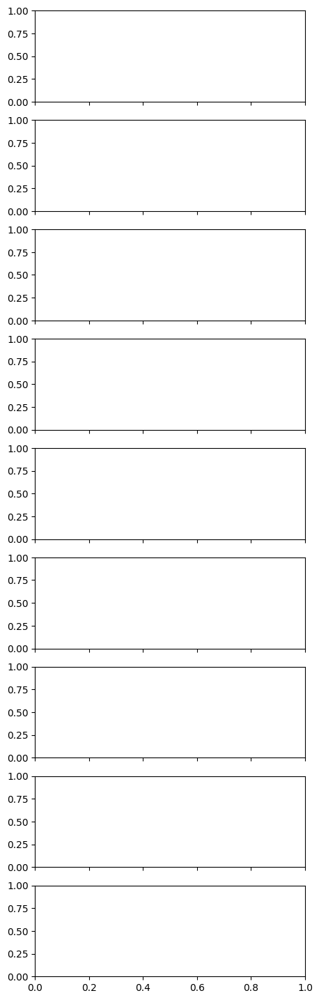

In [17]:
# Assuming `filtered_df` is already defined
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------------
# 1.  Bin edges   -----------------------------------------------------------
bins = np.linspace(0, 65_000, 100, dtype=np.float64)   # 99 equal-width bins
nbins = len(bins) - 1
bin_centres = bins[:-1]                                # x-coords for step plot

# ---------------------------------------------------------------------------
# 2.  Digitise every mCherry value once  ------------------------------------
vals = filtered_df['mCherry_intensity_mean'].to_numpy(np.float64)
bin_idx = np.searchsorted(bins, vals, side='right') - 1          # vectorised
keep = (bin_idx >= 0) & (bin_idx < nbins)                        # inside range

df = filtered_df.loc[keep, :].copy()
df['bin_idx'] = bin_idx[keep]                                    # add new col

# ---------------------------------------------------------------------------
# 3.  Fast C-level aggregation  ---------------------------------------------
group_cols = ['construct', 'date', 'well',
              'experimentparameter', 'timepoint', 'bin_idx']

#  ➜ One groupby, no Python loops inside
#  result: rows = unique subgroup (five columns), cols = 0…98 bins
counts = (
    df.groupby(group_cols, sort=False)        # sort=False keeps input order
      .size()                                 # size of each (subgroup, bin)
      .unstack(fill_value=0)                  # pivot bin_idx to columns
)

# ---------------------------------------------------------------------------
# 4.  Plotting ---------------------------------------------------------------
constructs = counts.index.get_level_values('construct').unique()

fig, axes = plt.subplots(len(constructs), 1,
                         figsize=(5, 2 * len(constructs)),
                         sharex=True)
axes = np.atleast_1d(axes)

for ax, con in zip(axes, constructs):
    subgroup_counts = counts.loc[con]   # DataFrame: one row per subgroup
    for row in subgroup_counts.itertuples(index=False):
        # Fastest draw: step plot (one Path, no edges)
        ax.plot(bin_centres, row, drawstyle='steps-post', alpha=0.3)
    ax.set_title(con)
    ax.set_ylabel('Count')

axes[-1].set_xlabel('mCherry_intensity_mean')
plt.tight_layout()
plt.show()


In [15]:
#reworfked violin plot dataframes below
def position_set(df, ordering: list, column_name: str, offset_variable: int=4 , comparison_to='experimentparameter'):
    
    
    order = {c: i + 1 for i, c in enumerate(ordering)}
    df['base_position'] = df[column_name].map(order)
    
    mapping = {}
    for item, map_item in order.items():
        # Get unique experimentparameters for this construct, preserving order of appearance
        unique_params = pd.unique(df.loc[df[column_name] == item, comparison_to])
        n = len(unique_params)
        # Compute offsets evenly in (you can adjust the range as needed)
        offsets = (np.arange(n) - (n-1) / 2) / offset_variable
        for exp, offset in zip(unique_params, offsets):
            mapping[(item, exp)] = offset
    #Set subpositions
    df['subposition_offset'] = df.apply(
    lambda row: mapping.get((row[column_name], row[comparison_to]), np.nan),
    axis=1
)
    df =df.dropna()
    #ensure base_positions are type int
    df['base_position'] = df['base_position'].astype(int)
    #set violin plot positions
    df['plot_position'] = df['base_position'] + df['subposition_offset']

    return df

In [16]:
timepoint = [1, 4, 8]
time_position = merged_delta.copy()
new_test = position_set(time_position, timepoint, 'timepoint')
new_test['timepoint'] = new_test['timepoint'] *6

C:\Users\Owner\AppData\Local\Temp\ipykernel_16540\3737653525.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['base_position'] = df['base_position'].astype(int)
C:\Users\Owner\AppData\Local\Temp\ipykernel_16540\3737653525.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['plot_position'] = df['base_position'] + df['subposition_offset']
C:\Users\Owner\AppData\Local\Temp\ipykernel_16540\1603032044.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

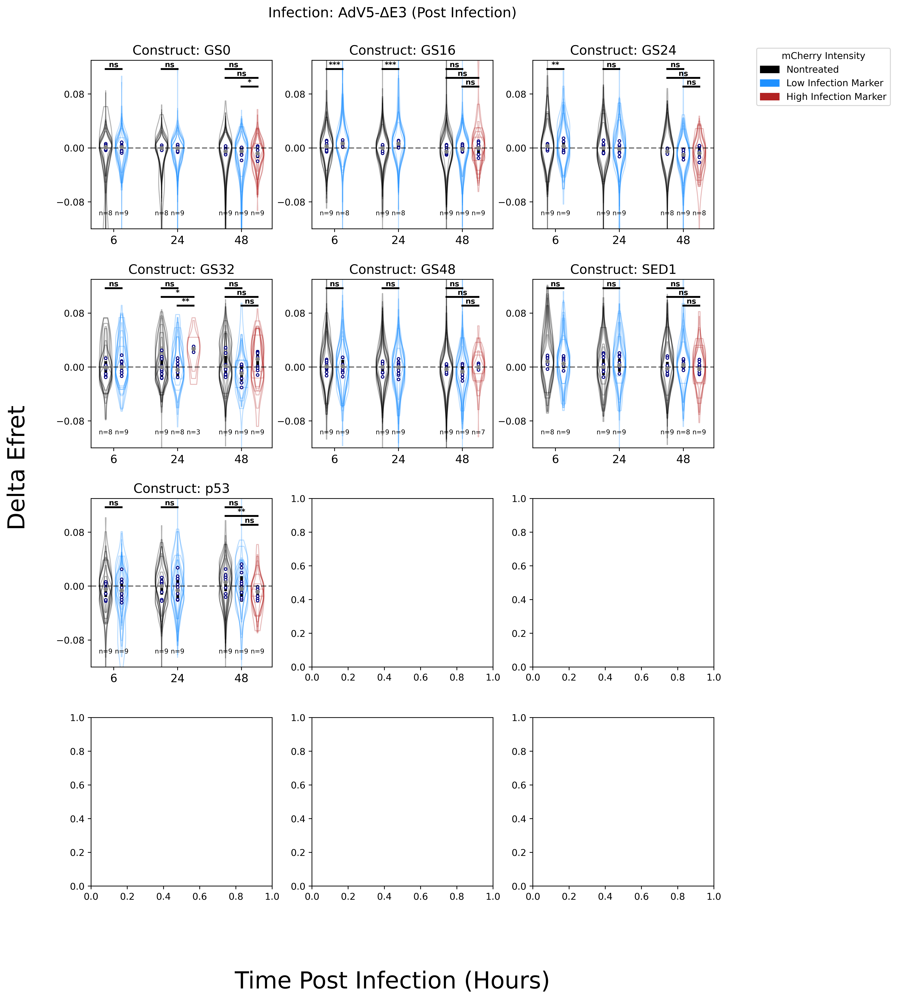

In [23]:
save_name = 'control_infection_violin_figure_popcutoff-10000_timelayout_3x4subplots.svg'

reduced_df = new_test #change
#reduced_df = replaced_data.loc[(replaced_data['timepoint']==1) | (replaced_data['timepoint']==4) | (replaced_data['timepoint']==8)]

mpl.rcParams['figure.dpi'] = 500
save_plot = True

unique_parameters = reduced_df.experimentparameter.unique()
color_palette = ['k', 'dodgerblue', 'firebrick', 'brown']
colors = {}

for i, param in enumerate(unique_parameters):
    colors[param] = color_palette[i]

construct = len(reduced_df.construct.unique())
timepoints = len(reduced_df.timepoint.unique())
parameter = len(reduced_df.experimentparameter.unique())

grouped_values = ['construct'] #change

uni_construct = reduced_df.construct.unique()
uni_timepoints = reduced_df.timepoint.unique() #add
#indexer length
row_len = construct #change

fig, ax = plt.subplots(3, 3, figsize=(12,16)) #change
ax = ax.flatten() #added

new_tmp = reduced_df
median_violin_generator = new_tmp.groupby(grouped_values, observed=True, as_index=True)

for index, container in enumerate(median_violin_generator):
    ymax = 0.13
    ymin = -0.12
    tmp_construct = container[0][0]#added
    tmp_df = container[1]
    row = index
    
    ax[row].scatter(x= tmp_df['plot_position'], y=tmp_df['delta_Efret_median_x'], s=13, c='gray', zorder=3) #change
    ax[row].errorbar(x= tmp_df['plot_position'], y=tmp_df['delta_Efret_median_x'], yerr= tmp_df['std_median_per_timepoint'], 
                     linestyle='none', color='k',elinewidth=3) #change
    y=0
    con_holder = None
    tmp_df = tmp_df.sort_values(by='plot_position', ascending=True)# added
    for x in tmp_df['plot_position']:
        current_well_n = tmp_df.loc[tmp_df['plot_position']==x, 'well_count_per_timepoint'].iloc[0]
        ax[row].text(x, ymin+0.02, f'n={current_well_n}', ha='center', fontsize=7)
        
        len_param = tmp_df.experimentparameter.nunique()
        #set timepoint
        current_construct = tmp_df.loc[tmp_df['plot_position']==x, 'timepoint'].iloc[0] #change

        if con_holder == None:
            con_holder = current_construct
            comparison_positions = x #added
            y=1
            continue
            
        #growth positions will not plot    
        if current_construct != con_holder:
            y=1
            comparison_positions = x #added
            con_holder = current_construct
            continue
        
        if y == len_param:
            y=1
            continue

        x_coords = (comparison_positions, x)    #added
        y_pos = ymax - y*0.013
        star_val = tmp_df.loc[tmp_df['plot_position']==x, 'star_value']
        ax[row].plot(x_coords, (y_pos, y_pos), linewidth=2, c='k') #added
        
        center_x = sum(x_coords)/len(x_coords) #added
        ax[row].text(center_x, y_pos+0.003, s=star_val.iloc[0], fontsize=8, fontweight='bold', ha='center') #change
        #added below
        if y==1:
            noninfected_x = x
            y+=1
            continue

        inf_x_coor = (noninfected_x, x)
        inf_x_center = sum(inf_x_coor)/ len(inf_x_coor)
        new_y = ymax - (y+1) *0.013

        
        new_plot_val = infect_comp.loc[(infect_comp['construct'] == tmp_construct) & (infect_comp['timepoint']== current_construct) & (infect_comp['experimentparameter']== 'infected')]
        star = new_plot_val['star_value'].iloc[0]
        ax[row].text(inf_x_center, new_y+0.003, s=star, fontsize=8, fontweight='bold', ha='center')
        ax[row].plot(inf_x_coor, (new_y, new_y), linewidth=2, c= 'k')
        #finished adding
        y+=1

        
        
    ax[row].set_ylim([ymin, ymax])
    tmp_explode = tmp_df.explode('delta_Efret_median_list')
    ax[row].scatter(x=tmp_explode['plot_position'] , y=tmp_explode['delta_Efret_median_list'], s=8, c='white', 
                    edgecolor='navy', linewidth=1, zorder=2)

    tmp_explode = tmp_df.explode('delta_Efret_list')
    
    iterator = 0 

    for x in tmp_df['plot_position']:
        list_explode = tmp_explode.loc[tmp_explode['plot_position']== x]
        current_parameter = tmp_explode.loc[tmp_explode['plot_position']== x, 'experimentparameter'].iloc[0]
        
        len_dataframe = len(list_explode)
        
        len_para = tmp_explode.experimentparameter.nunique()
        if iterator == len_para:
            iterator = 0
        if 'Growth' == current_parameter:
            iterator = 0 
            
        current_color = colors[current_parameter]
        
        for sub in range(len_dataframe):
            current_dataframe = list_explode.iloc[sub]
            
            final_explode = current_dataframe['delta_Efret_list']
            violins =ax[row].violinplot(final_explode, [x], widths=0.2, showextrema=False, showmedians=False, showmeans=False)

            
            for pc in violins['bodies']:
                pc.set_facecolor('None')
                pc.set_edgecolor(current_color)
                pc.set_aplha=0.3

        iterator += 1
    
    ax[row].set_xticks(np.arange(1, timepoints+1, 1)) #change
    ax[row].set_xticklabels(uni_timepoints, fontsize='large') #change
    ax[row].set_title('Construct: '+ str(container[0][0]), fontsize=14)

    ax[row].set_yticks([-0.08, 0, 0.08])
    #ax[row].set_ylabel('Delta Efret', fontsize=20)

    ax[row].axhline(y=0, c='k', linestyle='--', alpha=0.5)
#change
fig.supxlabel('Time Post Infection (Hours)', fontsize=25)
fig.supylabel('Delta Efret', fontsize=25)

patch = []
labels = ['Nontreated', 'Low Infection Marker', 'High Infection Marker']
for color, label in zip(color_palette, labels):
    
    tmp_patch = mpatches.Patch(color=color, label=label)
    patch.append(tmp_patch)
plt.legend(title='mCherry Intensity', handles=patch, loc='upper right', bbox_to_anchor=(2, 5))
plt.subplots_adjust(wspace=0.22, hspace=0.3)
fig.suptitle('Infection: AdV5-'+'\u0394'+'E3 (Post Infection)', fontsize=15, x=0.5, y=0.93)
if save_plot:
    plt.savefig(r'W:\OneDrive\Virus\Paper1\Paper1_figures\Violin_figures\\'+ save_name, format='svg', bbox_inches='tight')
plt.show()

In [18]:
infect_com_df = new_test.loc[new_test['experimentparameter'] != 'Growth']


In [19]:
comparison_group = ['construct', 'timepoint', 'experimentparameter']

In [20]:
def get_population_significance(df, group_values, sign_column='Efret_median', observed=False,
                                 as_index=False, equal_var=True, nan_policy='propagate',
                                 comparison_value='Growth', comparison_column='experimentparameter'):
    
    groupby_df = df.groupby(group_values, observed=observed, as_index=as_index)
    sign_df = pd.DataFrame()
    comparison_population = None  # Store this globally so other groups can compare to it

    for group_key, group_data in groupby_df:
        # Convert group_key to dict using group_values
        group_dict = dict(zip(group_values, group_key if isinstance(group_key, tuple) else (group_key,)))

        # Extract comparison value
        current_comp_val = group_data[comparison_column].unique()[0]

        # If this group is the comparison group
        if current_comp_val == comparison_value:
            comparison_population = group_data[sign_column].iloc[0]
        
            ttest, pvalue, star = 'NaN', 'NaN', 'ns'
        else:
            if comparison_population is None:
                raise ValueError(f"Comparison population for '{comparison_value}' not found before other group.")
            variable_population = group_data[sign_column].iloc[0]
            ttest, pvalue = stats.ttest_ind(comparison_population, variable_population,
                                            nan_policy=nan_policy)
            
            star = set_pvalue(pvalue)
        
        # Build result dictionary
        result = {k: group_dict[k] for k in group_values}
        result.update({
            comparison_column: current_comp_val,
            'ttest': ttest,
            'pvalue': pvalue,
            'star_value': star
        })
        
        # Append to result dataframe
        sign_df = pd.concat([sign_df, pd.DataFrame([result])], ignore_index=True)

    return sign_df

In [21]:
infect_comp = get_population_significance(infect_com_df, comparison_group, 'Efret_median_list', comparison_value='noninfected')

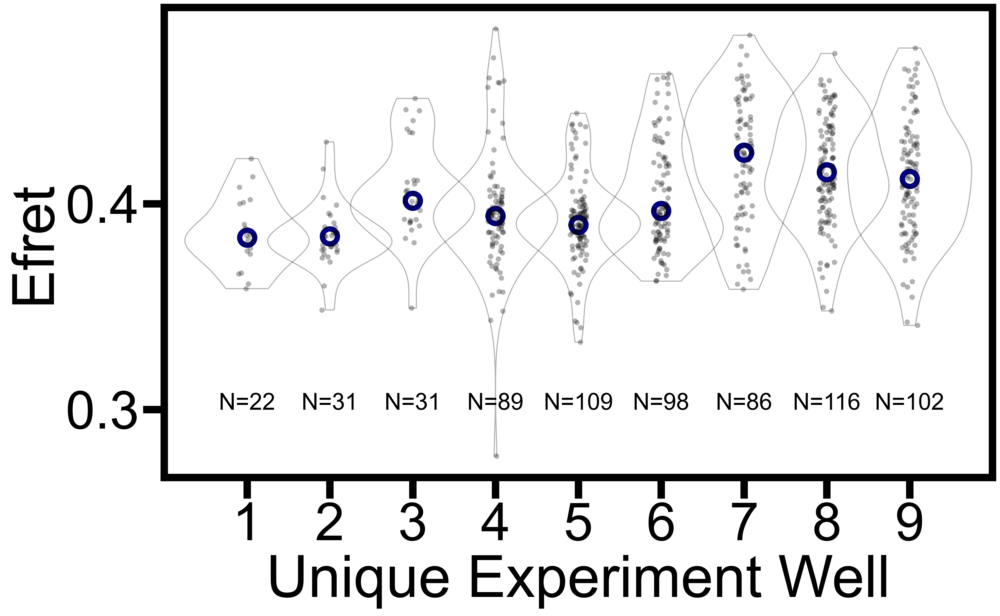

In [58]:
#make violin plot examples

GS32 = recom_df.loc[(recom_df['construct'] == 'GS32') & (recom_df['timepoint']==4) & (recom_df['experimentparameter']=='Growth')]

fig, ax = plt.subplots(figsize=(14, 8))
generator = GS32.groupby(['date', 'well'])
for i, df_container in enumerate(generator):
    iter_df = df_container[1]
    violins = ax.violinplot(iter_df['Efret'], [i], widths =1.5, showextrema=False, showmedians=False, showmeans=False)

    for pc in violins['bodies']:
                pc.set_facecolor('None')
                pc.set_edgecolor('k')
                pc.set_aplha=0.6

    median = iter_df['Efret'].median()
    ax.scatter(i, median, s=200, edgecolor='navy', linewidth=5, color ='white')
    
    sns.stripplot(iter_df, x= i+1, y = 'Efret', color='k', alpha=0.3)
    
    ax.text(i, 0.3, s='N='+ str(len(iter_df)), fontsize=22, ha='center')

ax.set_xlim(-1, 9)
ax.set_xlabel('Unique Experiment Well')
plt.savefig(r'W:/OneDrive/Virus/Paper1/new_fig/example_violin.svg', format='svg', bbox_inches='tight')

In [54]:
control_df = comb_df.loc[
    ((comb_df['construct'] == 'mTQ2') | (comb_df['construct'] == 'mNG')) &
    (comb_df['timepoint'] == 2) &
    (comb_df['experimentcondition'] == 'Growth')
]
control_df['construct'].unique()

array(['mNG', 'mTQ2'], dtype=object)

'\n#same fits but with labeled axis\nplot_FP(df,\'mTQ2\',"ch1",\'ch2\')\nplt.ylabel(\'acceptor emission\',size=22)\nplt.xlabel("donor emission",size=22)\nplt.savefig(\'bleedthrough.svg\', format="svg",bbox_inches=\'tight\')\n#fit for getting cross excitation\nplot_FP(df,\'mNG\',"ch3",\'ch2\')\nplt.ylabel(\'acceptor emission\',size=22)\nplt.xlabel("direct acceptor emission",size=22)\nplt.savefig(\'crossexcitation.svg\', format="svg",bbox_inches=\'tight\')\n'

<Figure size 9000x9000 with 0 Axes>

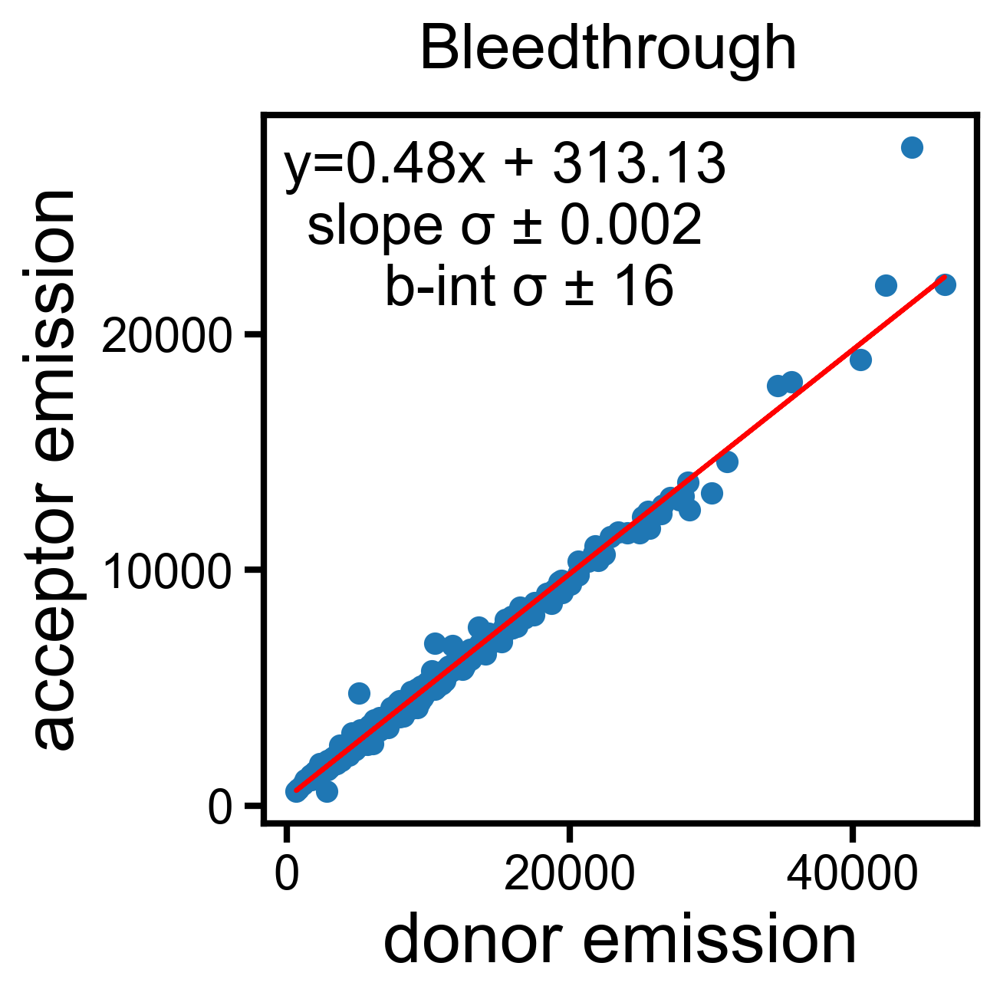

<Figure size 9000x9000 with 0 Axes>

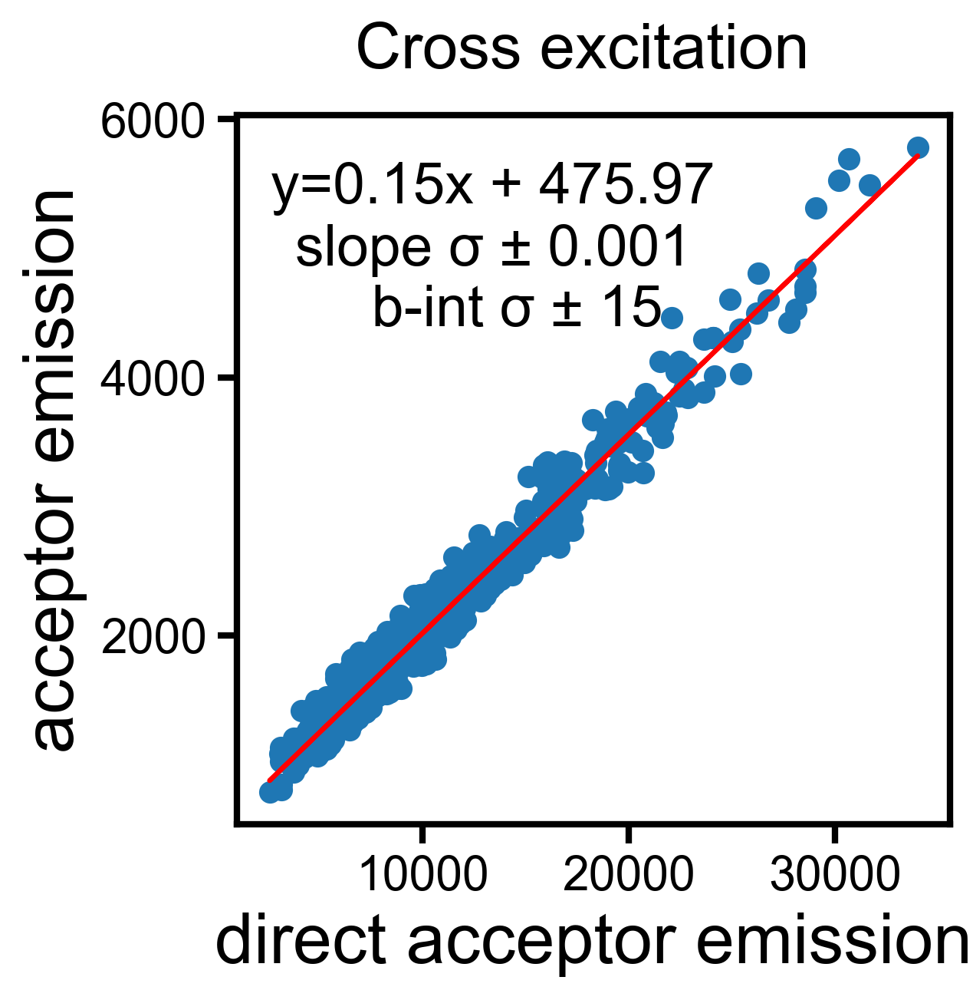

In [75]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

mpl.rcParams['xtick.major.size'] = 6
mpl.rcParams['xtick.major.width'] = 2
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.major.width'] = 2

mpl.rcParams['axes.linewidth'] = 2
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14



bl_cx_df =control_df

def plot_FP(df,construct,x,y):
    plt.figure(figsize= (30,30))
    selected=df[df['construct']==construct]
    p,cov=np.polyfit(selected[x], selected[y],1,cov=True)
    slope=p[0]
    intercept=p[1]
    std_err=np.sqrt(np.diag(cov))
    slope_std_err= std_err[0]
    int_std_err = std_err[1]
    fig1,ax1=plt.subplots(1,1,figsize=(4,4))
    # sns.regplot(x,y,data=selected)
    plt.scatter(x,y,data=selected)
    plt.plot(selected[x],np.polyval(p,selected[x]),color='red')
    ax1.set_ylabel(y,size=22)
    ax1.set_xlabel(x,size=22)
    # plt.ylim(2500,8000)
    
    plt.text(
        s='y={:.2f}x + {:.2f} \nslope \u03C3 \u00B1 {:.3f} \n  b-int \u03C3 \u00B1 {:.0f}'.format(slope, intercept,slope_std_err,int_std_err),horizontalalignment='center',
        x=(selected[x].min()+ selected[x].max()*0.33),
        y=(selected[y].max() - (selected[y].max()*0.24)), 
        fontsize=18
    )
    plt.locator_params(axis='x',tight=True, nbins=4)
    plt.locator_params(axis='y',tight=True, nbins=4)

    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    #plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
    #plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False
    if construct=='mTQ2':
        plt.suptitle('Bleedthrough', size=20)
    else:
        plt.suptitle('Cross excitation', size=20)

#fit for getting bleed through and cross excitation
plot_FP(bl_cx_df,'mTQ2',"donor_intensity_mean","acceptor_intensity_mean")
plt.ylabel('acceptor emission',size=22)
plt.xlabel("donor emission",size=22)
plt.savefig('bleedthrough.svg', format="svg",bbox_inches='tight')

bl_cx_df = bl_cx_df.loc[(bl_cx_df['directAcceptor_intensity_max']< 50000) & (bl_cx_df['directAcceptor_intensity_min'] > 400)]
plot_FP(bl_cx_df,'mNG',"directAcceptor_intensity_mean","acceptor_intensity_mean")
plt.ylabel('acceptor emission',size=22)
plt.xlabel("direct acceptor emission",size=22)
plt.savefig('crossexcitation.svg', format="svg",bbox_inches='tight')
'''
#same fits but with labeled axis
plot_FP(df,'mTQ2',"ch1",'ch2')
plt.ylabel('acceptor emission',size=22)
plt.xlabel("donor emission",size=22)
plt.savefig('bleedthrough.svg', format="svg",bbox_inches='tight')
#fit for getting cross excitation
plot_FP(df,'mNG',"ch3",'ch2')
plt.ylabel('acceptor emission',size=22)
plt.xlabel("direct acceptor emission",size=22)
plt.savefig('crossexcitation.svg', format="svg",bbox_inches='tight')
'''